## TESTING

Image-to-image translation is the task of converting an input image from one domain to another while preserving its content and structure. It involves learning a mapping function from paired examples of images in different domains.

The general process of training and evaluating a deep learning model:
1. Set up environments
2. Define your networks
3. Load your datasets 
4. Preprocess your datasets
5. Set up the training
6. Evaluation

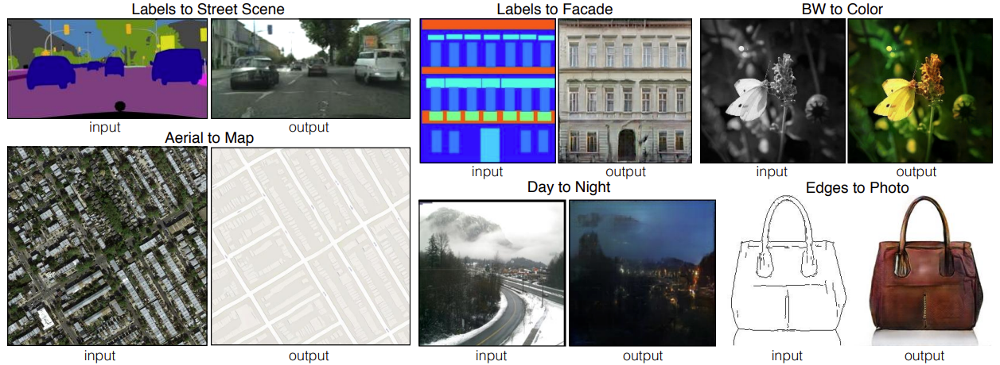

## 1. Set up your environments

In [1]:
'''
install pytorch, torchvision, tqdm, numpy, matplotlib, glob, PIL
pip3 install torch torchvision torchaudio
pip install tqdm
pip install matplotlib
pip install glob2 
pip install pillow
'''

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision
from torchvision.utils import make_grid,save_image
from torchvision import models, transforms, datasets

import os
from tqdm.auto import tqdm
import numpy as np
import matplotlib.pyplot as plt
from glob import glob 
from PIL import Image
import tarfile

## 2. Define your network
Reference paper: https://arxiv.org/abs/1611.07004 \
Official implementation: https://github.com/phillipi/pix2pix \
Demo:https://affinelayer.com/pixsrv/ 
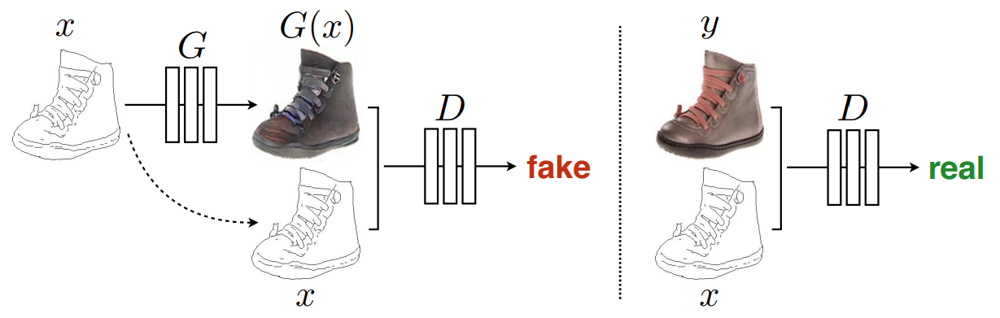

In [2]:
class ResnetBlock(nn.Module):
    """Define a Resnet block"""
    def __init__(self, dim,norm_layer, activation=nn.ReLU(True), use_dropout=False, use_bias=False):
        super(ResnetBlock, self).__init__()
        self.conv_block = self.build_conv_block(dim, norm_layer, use_dropout, use_bias)

    def build_conv_block(self, dim, norm_layer, use_dropout, use_bias):
        conv_block = []
        conv_block += [nn.ReflectionPad2d(1)]
        conv_block += [nn.Conv2d(dim, dim, kernel_size=3, padding=0, bias=use_bias), norm_layer(dim), nn.ReLU(True)]
        if use_dropout:
            conv_block += [nn.Dropout(0.5)]
        conv_block += [nn.ReflectionPad2d(1)]
        conv_block += [nn.Conv2d(dim, dim, kernel_size=3, padding=0, bias=use_bias), norm_layer(dim)]
        return nn.Sequential(*conv_block)

    def forward(self, x):
        """Forward function (with skip connections)"""
        out = x + self.conv_block(x)  # add skip connections
        return out

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.enc1 = self.conv2Relu(3, 32, 5)
        self.enc2 = self.conv2Relu(32, 64, pool_size=4)
        self.enc3 = self.conv2Relu(64, 128, pool_size=2)
        self.enc4 = self.conv2Relu(128, 256, pool_size=2)
        self.bottleneck = ResnetBlock(256, norm_layer=nn.InstanceNorm2d) 
        self.dec1 = self.deconv2Relu(256, 128, pool_size=2)
        self.dec2 = self.deconv2Relu(128+128, 64, pool_size=2)
        self.dec3 = self.deconv2Relu(64+64, 32, pool_size=4)
        self.dec4 = nn.Sequential(nn.Conv2d(32+32, 3, 5, padding=2),nn.Tanh())
        
    def conv2Relu(self, in_c, out_c, kernel_size=3, pool_size=None):
        layer = []
        if pool_size:
            # Down width and height
            layer.append(nn.AvgPool2d(pool_size))
        # Up channel size 
        layer.append(nn.Conv2d(in_c, out_c, kernel_size, padding=(kernel_size-1)//2))
        layer.append(nn.LeakyReLU(0.2, inplace=True))
        layer.append(nn.BatchNorm2d(out_c))
        layer.append(nn.ReLU(inplace=True))
        return nn.Sequential(*layer)
    
    def deconv2Relu(self, in_c, out_c, kernel_size=3, stride=1, pool_size=None):
        layer = []
        if pool_size:
            # Up width and height
            layer.append(nn.UpsamplingNearest2d(scale_factor=pool_size))
        # Down channel size 
        layer.append(nn.Conv2d(in_c, out_c, kernel_size, stride, padding=1))
        layer.append(nn.BatchNorm2d(out_c))
        layer.append(nn.ReLU(inplace=True))
        return nn.Sequential(*layer)
    
    def forward(self, x):
        x1 = self.enc1(x)
        x2 = self.enc2(x1)
        x3 = self.enc3(x2)
        x4 = self.enc4(x3) # (b, 256, 4, 4)
        x = self.bottleneck(x4)
        x = self.bottleneck(x)
        x = self.bottleneck(x)
        out = self.dec1(x)
        out = self.dec2(torch.cat((out, x3), dim=1)) # concat channel 
        out = self.dec3(torch.cat((out, x2), dim=1))
        out = self.dec4(torch.cat((out, x1), dim=1)) # (b, 3, 64, 64)
        return out 
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.layer1 = self.conv2relu(6, 16, 5, cnt=1)
        self.layer2 = self.conv2relu(16, 32, pool_size=4)
        self.layer3 = self.conv2relu(32, 64, pool_size=2)
        self.layer4 = self.conv2relu(64, 128, pool_size=2)
        self.layer5 = self.conv2relu(128, 256, pool_size=2)
        self.layer6 = nn.Conv2d(256, 1, kernel_size=1)
        
    def conv2relu(self, in_c, out_c, kernel_size=3, pool_size=None, cnt=2):
        layer = []
        for i in range(cnt):
            if i == 0 and pool_size != None:
                # Down width and height 
                layer.append(nn.AvgPool2d(pool_size))
            # Down channel size 
            layer.append(nn.Conv2d(in_c if i == 0 else out_c, 
                                   out_c,
                                   kernel_size,
                                   padding=(kernel_size-1)//2))
            layer.append(nn.BatchNorm2d(out_c))
            layer.append(nn.LeakyReLU(0.2, inplace=True))
        return nn.Sequential(*layer)
        
    def forward(self, x, x1):
        x = torch.cat((x, x1), dim=1)
        out = self.layer5(self.layer4(self.layer3(self.layer2(self.layer1(x)))))
        return self.layer6(out) # (b, 1, 2, 2)

# 3. Loading the data
http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/ \
Dataset file structure:\
├─Dataset_name \
├─train\
├─test\
└─val
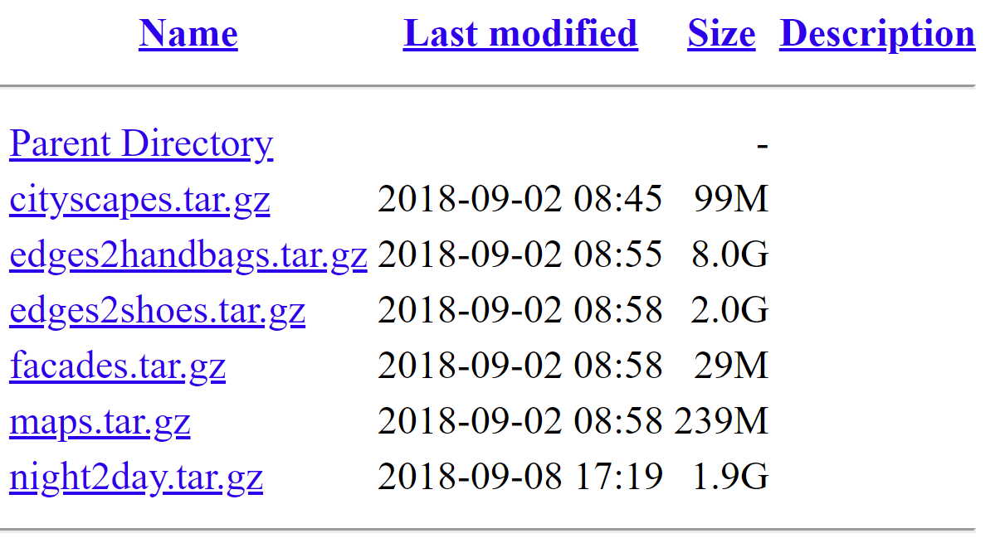

In [3]:
#download from the Internet
import requests
datasets = ['facades','cityscapes','maps']
data_name = datasets[2] # here we choose facades
filename = str(data_name)+'.tar.gz'
url = 'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/'+filename
response = requests.get(url, stream=False)
with open(filename, 'wb') as file:
    file.write(response.content)

In [4]:
# unzip the dataset
dataset = tarfile.open(filename, 'r')
dataset.extractall(path='./') # current directory
dataset.close()

## 4. Preprocess the dataset
4.1 read and normalize the data\
4.2 load the training and testing set

In [5]:
# parameters for normalization
mean = (0.5, 0.5, 0.5) 
std = (0.5, 0.5, 0.5)

# parameter for preprocessing
resize = 64 # we use 64 to reduce the training time

def read_data(root_dir,dataset_type):
    path = os.path.join(root_dir, dataset_type)
    dataset = []
    for img in glob(path+"/"+"*.jpg"):
        dataset.append(img) 
    return dataset 

# normalization and resize
class Transform():
    def __init__(self, resize=resize, mean=mean, std=std):
        self.data_transform = transforms.Compose([
            transforms.Resize((resize, resize)), 
            transforms.ToTensor(),
            transforms.Normalize(mean, std)
        ])
        
    def __call__(self, img):
        return self.data_transform(img)

class Dataset(object):
    def __init__(self, files):
        self.files = files 
        self.trasformer = Transform()
        
    def _separate(self, img):
        img = np.array(img, dtype=np.uint8)
        h, w, _ = img.shape
        w = int(w/2)
        return Image.fromarray(img[:, w:, :]), Image.fromarray(img[:, :w, :])
    
    def __getitem__(self, idx):
        img = Image.open(self.files[idx])
        input, output = self._separate(img)
        input_tensor = self.trasformer(input)
        output_tensor = self.trasformer(output)
        return input_tensor, output_tensor 
    
    def __len__(self):
        return len(self.files)
    
def show_img_sample(img, img1):
    fig, axes = plt.subplots(1, 2, figsize=(15, 8))
    ax = axes.ravel()
    ax[0].imshow(img.permute(1, 2, 0))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[0].set_title("input image", c="g")
    ax[1].imshow(img1.permute(1, 2, 0))
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    ax[1].set_title("label image", c="g")
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

In [6]:
# read the data
datasets = ['facades','cityscapes','maps']
data_name = datasets[0]
train = read_data(data_name,"train")
test = read_data(data_name,"val")
dataset_train = Dataset(train)
dataset_test = Dataset(test)

# only read 200 images for training
subset_indices = range(200)
dataset_train = torch.utils.data.Subset(dataset_train, subset_indices)

In [7]:
print(len(dataset_train)) # data for training
print(len(dataset_test)) # data for testing

200
0


In [8]:
# Demostrate the data sample
show_img_sample(dataset_train.__getitem__(1)[0], dataset_train.__getitem__(1)[1])

IndexError: list index out of range

## 5.Set up the training

In [ ]:
def train_fn(train_dl, G, D, criterion_bce, criterion_mae, optimizer_g, optimizer_d):
    G.train()
    D.train()
    LAMBDA = 100.0
    total_loss_g, total_loss_d = [], []
    for i, (input_img, real_img) in enumerate(tqdm(train_dl,leave=False)):
        input_img = input_img.to(device)
        real_img = real_img.to(device)
        
        real_label = torch.ones(input_img.size()[0], 1, 2, 2)
        fake_label = torch.zeros(input_img.size()[0], 1, 2, 2)
        # Generator 
        fake_img = G(input_img)
        fake_img_ = fake_img.detach() # commonly using 
        out_fake = D(fake_img, input_img)
        loss_g_bce = criterion_bce(out_fake, real_label) # binaryCrossEntropy
        loss_g_mae = criterion_mae(fake_img, real_img) # MAELoss
        loss_g = loss_g_bce + LAMBDA * loss_g_mae 
        total_loss_g.append(loss_g.item())
        
        optimizer_g.zero_grad()
        optimizer_d.zero_grad()
        loss_g.backward(retain_graph=True)
        optimizer_g.step()
        
        # Discriminator
        out_real = D(real_img, input_img)
        loss_d_real = criterion_bce(out_real, real_label)
        out_fake = D(fake_img_, input_img)
        loss_d_fake = criterion_bce(out_fake, fake_label)
        loss_d = loss_d_real + loss_d_fake 
        total_loss_d.append(loss_d.item())
        
        optimizer_g.zero_grad()
        optimizer_d.zero_grad()
        loss_d.backward()
        optimizer_d.step()
    return np.mean(total_loss_g), np.mean(total_loss_d), fake_img_.cpu() 


def saving_img(fake_img, e):
    os.makedirs("generated", exist_ok=True)
    save_image(fake_img, f"generated/fake{str(e)}.png",normalize=True)
    
def saving_logs(result):
    with open("train.pkl", "wb") as f:
        pickle.dump([result], f)
        
def saving_model(D, G, e):
    os.makedirs("weight", exist_ok=True)
    torch.save(G.state_dict(), f"weight/G{str(e+1)}.pth")
    torch.save(D.state_dict(), f"weight/D{str(e+1)}.pth")
        
def show_losses(g, d):
    fig, axes = plt.subplots(1, 2, figsize=(14,6))
    ax = axes.ravel()
    ax[0].plot(np.arange(len(g)).tolist(), g)
    ax[0].set_title("Generator Loss")
    ax[1].plot(np.arange(len(d)).tolist(), d)
    ax[1].set_title("Discriminator Loss")
    plt.show()


def train_loop(train_dl, G, D, num_epoch, lr=0.0002, betas=(0.5, 0.999)):
    G.to(device)
    D.to(device)
    optimizer_g = torch.optim.Adam(G.parameters(), lr=lr, betas=betas)
    optimizer_d = torch.optim.Adam(D.parameters(), lr=lr, betas=betas)
    criterion_mae = nn.L1Loss()
    criterion_bce = nn.BCEWithLogitsLoss()
    total_loss_d, total_loss_g = [], []
    result = {}
    
    pbar=tqdm(range(num_epoch))
    for e in range(num_epoch):
        loss_g, loss_d, fake_img = train_fn(train_dl, G, D, criterion_bce, criterion_mae, optimizer_g, optimizer_d)
        total_loss_d.append(loss_d)
        total_loss_g.append(loss_g)
        saving_img(fake_img, e+1)
        
        if e%10 == 0:
            saving_model(D, G, e)
        pbar.set_description("epoch %d / %d " % (e+1,num_epoch))
    try:
        result["G"] = total_loss_d 
        result["D"] = total_loss_g 
        saving_logs(result)
        show_losses(total_loss_g, total_loss_d)
        saving_model(D, G, e)
        print("successfully save model")
    finally:
        return G, D 

#set up batch size
batch_size = 128

#set the device for training
device = "cuda:0" if torch.cuda.is_available() else "cpu"

#loading data for training and testing
torch.manual_seed(0)
np.random.seed(0)
train_dataloader = torch.utils.data.DataLoader(dataset_train, batch_size=batch_size, shuffle=True, drop_last=True)
test_dataloader = torch.utils.data.DataLoader(dataset_test, batch_size=batch_size, shuffle=False, drop_last=False)

# load network
G = Generator()
D = Discriminator()
epoch = 50 # takes ~ 5 minutes
# start training
trained_G, trained_D = train_loop(train_dataloader, G, D, epoch)

In [ ]:
#demonstrate training imgs of the first and the last epochs
def train_show_img(epoch, G):
#     G = load_model(name)
    root = "generated"
    fig, axes = plt.subplots(2, 1, figsize=(20, 20))
    ax = axes.ravel()
    
    filename = os.path.join(root, f"fake{1}.png")
    ax[0].imshow(Image.open(filename))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    
    filename = os.path.join(root, f"fake{epoch}.png")
    ax[1].imshow(Image.open(filename))
    ax[1].set_xticks([])
    ax[1].set_yticks([])
        
train_show_img(epoch,trained_G)

## 6. Evaluation

In [ ]:
def load_model(name):
    G = Generator()
    G.load_state_dict(torch.load(f"weight/G{name}.pth", map_location={"cuda:0": "cpu"}))
    G.eval()
    return G.to(device)

def de_norm(img):
    img_ = img.mul(torch.FloatTensor(std).view(3, 1, 1))
    img_ = img_.add(torch.FloatTensor(mean).view(3, 1, 1)).detach().numpy()
    img_ = np.transpose(img_, (1,2,0))
    return img_ 

def show_test_img(input_img,output_img,label):
    fig, axes = plt.subplots(1, 3, figsize=(15, 8))
    ax = axes.ravel()
    ax[0].imshow(input_img)
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[0].set_title("input image", c="g")
    ax[1].imshow(output_img)
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    ax[1].set_title("output image", c="g")
    ax[2].imshow(label)
    ax[2].set_xticks([])
    ax[2].set_yticks([])
    ax[2].set_title("label image", c="g")
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()
    
def evaluate(test_dataloader, G):
    with torch.no_grad():
        for input_img, real_img in tqdm(test_dataloader,leave=False):
            input_img = input_img.to(device)
            real_img = real_img.to(device)
            fake_img = G(input_img)
            test_num = 10#input_img.size()[0]
            for i in range(test_num):
                show_test_img(input_img[i].permute(1,2,0),de_norm(fake_img[i]),de_norm(real_img[i]))
        
# demonstrate 10 test samples
evaluate(test_dataloader,trained_G)

### Why the results are not ideal?
1. Data used to train the model is less (only 200 image pairs for training)
2. Resolution we used is low (we only use 64\*64, while the original resolution is 256\*256)
3. The network is too simple (we use a simplified network for demonstation)
4. The training epoch is too small (it usually train model for 200 epochs)

## Testing examples using pre-trained models
Pre-trained models are trained using high resolution, large dataset, and well designed networks and parameters.

Link for using the pretrained model:
https://colab.research.google.com/github/junyanz/pytorch-CycleGAN-and-pix2pix/blob/master/pix2pix.ipynb

## Results on colab using pretrained model

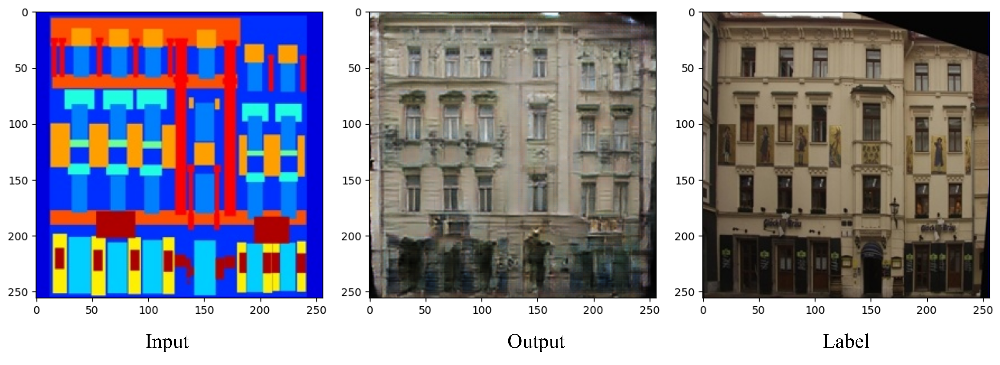

In [ ]:
!git clone https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix

In [ ]:
import os
os.chdir('pytorch-CycleGAN-and-pix2pix/')

In [ ]:
!pip install -r requirements.txt

In [ ]:
!bash ./datasets/download_pix2pix_dataset.sh maps